<a href="https://colab.research.google.com/github/jj2883/camelyon16/blob/master/VGG_ratio_55_sample_10k.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
!nvidia-smi


Wed May 15 16:20:32 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.56       Driver Version: 410.79       CUDA Version: 10.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   61C    P8    17W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [3]:
!apt update && apt install -y openslide-tools
!pip install openslide-python

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:2 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran35/ InRelease [3,609 B]
Get:3 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease [21.3 kB]
Hit:4 http://archive.ubuntu.com/ubuntu bionic InRelease
Ign:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [564 B]
Get:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release [564 B]
Get:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release.gpg [801 B]
Get:9 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release.gpg [801 B]
Get:10 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:11 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran35/ Packages [

In [4]:
#mount google drive
from google.colab import drive, files
drive.mount('/content/drive')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [9]:
!ls "/content/drive/My Drive/appdl_final/dataset/dataset"

tumor_001-020.tif   tumor_019.xml	tumor_059.xml	    tumor_091.tif
tumor_001_mask.tif  tumor_023_mask.tif	tumor_064_mask.tif  tumor_091.xml
tumor_001.xml	    tumor_023.tif	tumor_064.tif	    tumor_094_mask.tif
tumor_002_mask.tif  tumor_023.xml	tumor_064.xml	    tumor_094.tif
tumor_002.tif	    tumor_031_mask.tif	tumor_075_mask.tif  tumor_094.xml
tumor_002.xml	    tumor_031.tif	tumor_075.tif	    tumor_096_mask.tif
tumor_005_mask.tif  tumor_031.xml	tumor_075.xml	    tumor_096.tif
tumor_005.tif	    tumor_035_mask.tif	tumor_078_mask.tif  tumor_096.xml
tumor_005.xml	    tumor_035.tif	tumor_078.tif	    tumor_099.xml
tumor_012_mask.tif  tumor_035.xml	tumor_078.xml	    tumor_101_mask.tif
tumor_012.tif	    tumor_038.tif	tumor_081_mask.tif  tumor_101.tif
tumor_012.xml	    tumor_038.xml	tumor_081.tif	    tumor_101.xml
tumor_016_mask.tif  tumor_057_mask.tif	tumor_081.xml	    tumor_110_mask.tif
tumor_016.tif	    tumor_057.tif	tumor_084_mask.tif  tumor_110.tif
tumor_016.xml	    tumor_057.xml	tumor_084.

In [0]:

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray


# Read the slides

In [0]:
import os.path as osp
import openslide
from pathlib import Path

#BASE_TRUTH_DIR = Path('')

BASE_TRUTH_DIR = Path('/content/drive/My Drive/appdl_final/dataset/dataset')

slide_path1 = str(BASE_TRUTH_DIR / 'tumor_035.tif')
truth_path1 = str(BASE_TRUTH_DIR / 'tumor_035_mask.tif')

slide1 = openslide.open_slide(slide_path1)
truth1 = openslide.open_slide(truth_path1)


slide_path2 = str(BASE_TRUTH_DIR / 'tumor_002.tif')
truth_path2 = str(BASE_TRUTH_DIR / 'tumor_002_mask.tif')

slide2 = openslide.open_slide(slide_path2)
truth2 = openslide.open_slide(truth_path2)



slide_path3 = str(BASE_TRUTH_DIR / 'tumor_005.tif')
truth_path3 = str(BASE_TRUTH_DIR / 'tumor_005_mask.tif')

slide3 = openslide.open_slide(slide_path3)
truth3 = openslide.open_slide(truth_path3)



slide_path4 = str(BASE_TRUTH_DIR / 'tumor_012.tif')
truth_path4 = str(BASE_TRUTH_DIR / 'tumor_012_mask.tif')

slide4 = openslide.open_slide(slide_path4)
truth4 = openslide.open_slide(truth_path4)


slide_path5 = str(BASE_TRUTH_DIR / 'tumor_016.tif')
truth_path5 = str(BASE_TRUTH_DIR / 'tumor_016_mask.tif')

slide5 = openslide.open_slide(slide_path5)
truth5 = openslide.open_slide(truth_path5)


slide_path6 = str(BASE_TRUTH_DIR / 'tumor_019.tif')
truth_path6 = str(BASE_TRUTH_DIR / 'tumor_019_mask.tif')

slide6 = openslide.open_slide(slide_path6)
truth6 = openslide.open_slide(truth_path6)


slide_path7 = str(BASE_TRUTH_DIR / 'tumor_023.tif')
truth_path7 = str(BASE_TRUTH_DIR / 'tumor_023_mask.tif')

slide7 = openslide.open_slide(slide_path7)
truth7 = openslide.open_slide(truth_path7)


slide_path8 = str(BASE_TRUTH_DIR / 'tumor_031.tif')
truth_path8 = str(BASE_TRUTH_DIR / 'tumor_031_mask.tif')

slide8 = openslide.open_slide(slide_path8)
truth8 = openslide.open_slide(truth_path8)



slide_path9 = str(BASE_TRUTH_DIR / 'tumor_035.tif')
truth_path9 = str(BASE_TRUTH_DIR / 'tumor_035_mask.tif')

slide9 = openslide.open_slide(slide_path9)
truth9 = openslide.open_slide(truth_path9)



slide_path10 = str(BASE_TRUTH_DIR / 'tumor_057.tif')
truth_path10 = str(BASE_TRUTH_DIR / 'tumor_057_mask.tif')

slide10 = openslide.open_slide(slide_path10)
truth10 = openslide.open_slide(truth_path10)



slide_path11 = str(BASE_TRUTH_DIR / 'tumor_059.tif')
truth_path11 = str(BASE_TRUTH_DIR / 'tumor_059_mask.tif')

slide11 = openslide.open_slide(slide_path11)
truth11 = openslide.open_slide(truth_path11)



slide_path12 = str(BASE_TRUTH_DIR / 'tumor_064.tif')
truth_path12 = str(BASE_TRUTH_DIR / 'tumor_064_mask.tif')

slide12 = openslide.open_slide(slide_path12)
truth12 = openslide.open_slide(truth_path12)



slide_path13 = str(BASE_TRUTH_DIR / 'tumor_075.tif')
truth_path13 = str(BASE_TRUTH_DIR / 'tumor_075_mask.tif')

slide13 = openslide.open_slide(slide_path13)
truth13 = openslide.open_slide(truth_path13)



slide_path14 = str(BASE_TRUTH_DIR / 'tumor_078.tif')
truth_path14 = str(BASE_TRUTH_DIR / 'tumor_078_mask.tif')

slide14 = openslide.open_slide(slide_path14)
truth14 = openslide.open_slide(truth_path14)



slide_path15 = str(BASE_TRUTH_DIR / 'tumor_081.tif')
truth_path15 = str(BASE_TRUTH_DIR / 'tumor_081_mask.tif')

slide15 = openslide.open_slide(slide_path15)
truth15 = openslide.open_slide(truth_path15)



slide_path16 = str(BASE_TRUTH_DIR / 'tumor_084.tif')
truth_path16 = str(BASE_TRUTH_DIR / 'tumor_084_mask.tif')

slide16 = openslide.open_slide(slide_path16)
truth16 = openslide.open_slide(truth_path16)



slide_path17 = str(BASE_TRUTH_DIR / 'tumor_091.tif')
truth_path17 = str(BASE_TRUTH_DIR / 'tumor_091_mask.tif')

slide17 = openslide.open_slide(slide_path17)
truth17 = openslide.open_slide(truth_path17)



slide_path18 = str(BASE_TRUTH_DIR / 'tumor_094.tif')
truth_path18 = str(BASE_TRUTH_DIR / 'tumor_094_mask.tif')

slide18 = openslide.open_slide(slide_path18)
truth18 = openslide.open_slide(truth_path18)



slide_path19 = str(BASE_TRUTH_DIR / 'tumor_096.tif')
truth_path19 = str(BASE_TRUTH_DIR / 'tumor_096_mask.tif')

slide19 = openslide.open_slide(slide_path19)
truth19 = openslide.open_slide(truth_path19)



slide_path20 = str(BASE_TRUTH_DIR / 'tumor_101.tif')
truth_path20 = str(BASE_TRUTH_DIR / 'tumor_101_mask.tif')

slide20 = openslide.open_slide(slide_path20)
truth20 = openslide.open_slide(truth_path20)



slide_path21 = str(BASE_TRUTH_DIR / 'tumor_110.tif')
truth_path21 = str(BASE_TRUTH_DIR / 'tumor_110_mask.tif')

slide21 = openslide.open_slide(slide_path21)
truth21 = openslide.open_slide(truth_path21)




# Plot Slides their Mask

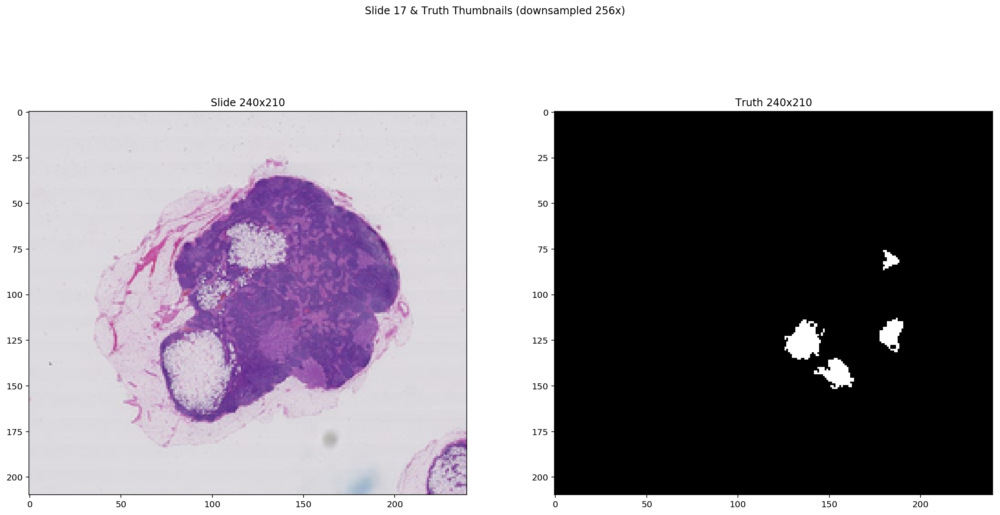

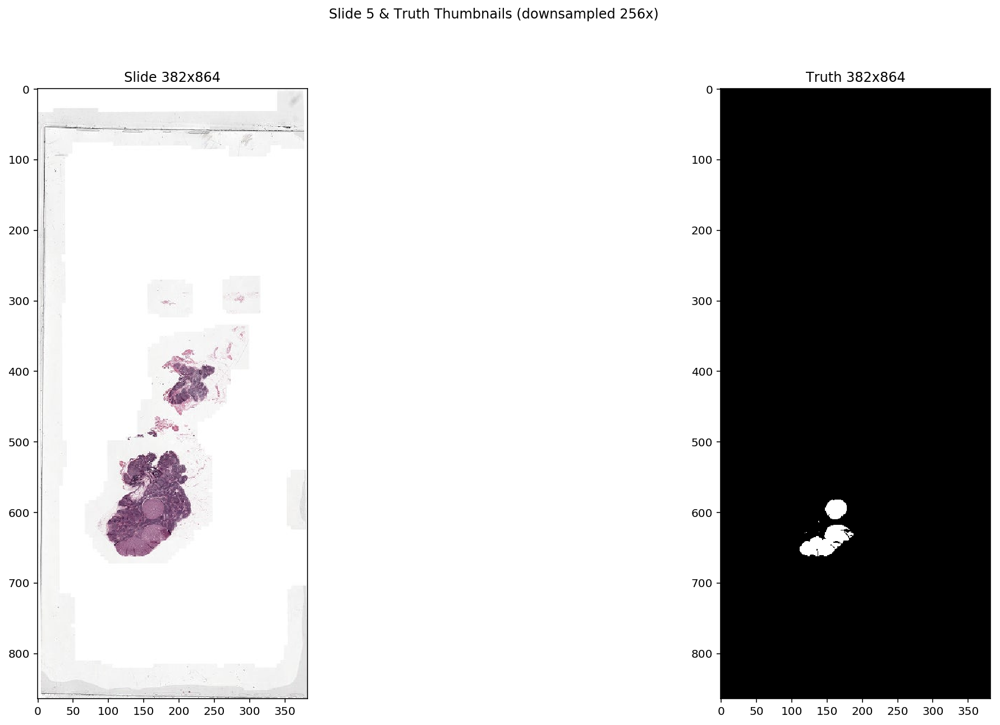

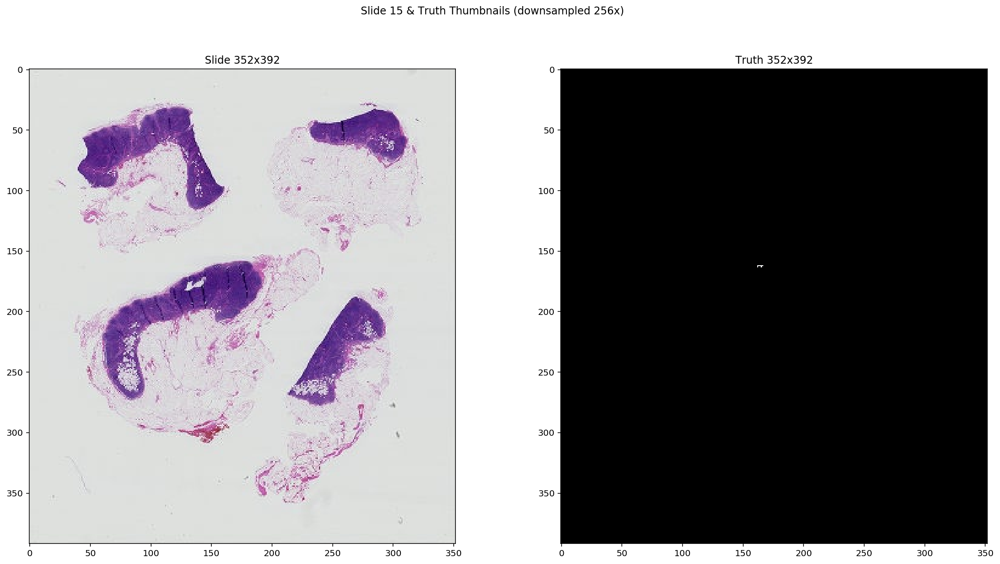

In [12]:
thumbnail = slide17.get_thumbnail((slide17.dimensions[0] / 256, slide17.dimensions[1] / 256))
thumbnail_truth = truth17.get_thumbnail((truth17.dimensions[0] / 256, truth17.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail);
ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide 17 & Truth Thumbnails (downsampled 256x)');

thumbnail = slide5.get_thumbnail((slide5.dimensions[0] / 256, slide5.dimensions[1] / 256))
thumbnail_truth = truth5.get_thumbnail((truth5.dimensions[0] / 256, truth5.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail);
ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide 5 & Truth Thumbnails (downsampled 256x)');


thumbnail = slide15.get_thumbnail((slide15.dimensions[0] / 256, slide15.dimensions[1] / 256))
thumbnail_truth = truth15.get_thumbnail((truth15.dimensions[0] / 256, truth15.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail);
ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide 15 & Truth Thumbnails (downsampled 256x)');



# Transform Slides and Masks into Tiles of 256 X 256 pixels

In [0]:
from skimage.filters import threshold_otsu

from openslide.deepzoom import DeepZoomGenerator 

tiles1 = DeepZoomGenerator(slide1, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth1 = DeepZoomGenerator(truth1, tile_size=256, overlap=0, limit_bounds=False)

tiles2 = DeepZoomGenerator(slide2, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth2 = DeepZoomGenerator(truth2, tile_size=256, overlap=0, limit_bounds=False)

tiles3 = DeepZoomGenerator(slide3, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth3 = DeepZoomGenerator(truth3, tile_size=256, overlap=0, limit_bounds=False)

tiles4 = DeepZoomGenerator(slide4, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth4 = DeepZoomGenerator(truth4, tile_size=256, overlap=0, limit_bounds=False)

tiles5 = DeepZoomGenerator(slide5, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth5 = DeepZoomGenerator(truth5, tile_size=256, overlap=0, limit_bounds=False)

tiles6 = DeepZoomGenerator(slide6, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth6 = DeepZoomGenerator(truth6, tile_size=256, overlap=0, limit_bounds=False)

tiles7 = DeepZoomGenerator(slide7, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth7 = DeepZoomGenerator(truth7, tile_size=256, overlap=0, limit_bounds=False)

tiles8 = DeepZoomGenerator(slide8, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth8 = DeepZoomGenerator(truth8, tile_size=256, overlap=0, limit_bounds=False)

tiles9 = DeepZoomGenerator(slide9, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth9 = DeepZoomGenerator(truth9, tile_size=256, overlap=0, limit_bounds=False)

tiles10 = DeepZoomGenerator(slide10, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth10 = DeepZoomGenerator(truth10, tile_size=256, overlap=0, limit_bounds=False)

tiles11 = DeepZoomGenerator(slide11, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth11 = DeepZoomGenerator(truth11, tile_size=256, overlap=0, limit_bounds=False)

tiles12 = DeepZoomGenerator(slide12, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth12 = DeepZoomGenerator(truth12, tile_size=256, overlap=0, limit_bounds=False)

tiles13 = DeepZoomGenerator(slide13, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth13 = DeepZoomGenerator(truth13, tile_size=256, overlap=0, limit_bounds=False)

tiles14 = DeepZoomGenerator(slide14, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth14 = DeepZoomGenerator(truth14, tile_size=256, overlap=0, limit_bounds=False)

tiles15 = DeepZoomGenerator(slide15, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth15 = DeepZoomGenerator(truth15, tile_size=256, overlap=0, limit_bounds=False)

tiles16 = DeepZoomGenerator(slide16, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth16 = DeepZoomGenerator(truth16, tile_size=256, overlap=0, limit_bounds=False)

tiles17 = DeepZoomGenerator(slide17, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth17 = DeepZoomGenerator(truth17, tile_size=256, overlap=0, limit_bounds=False)

tiles18 = DeepZoomGenerator(slide18, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth18 = DeepZoomGenerator(truth18, tile_size=256, overlap=0, limit_bounds=False)

tiles19 = DeepZoomGenerator(slide19, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth19 = DeepZoomGenerator(truth19, tile_size=256, overlap=0, limit_bounds=False)

tiles20 = DeepZoomGenerator(slide20, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth20 = DeepZoomGenerator(truth20, tile_size=256, overlap=0, limit_bounds=False)

tiles21 = DeepZoomGenerator(slide21, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth21 = DeepZoomGenerator(truth21, tile_size=256, overlap=0, limit_bounds=False)


# print(tiles.level_count)
# print(tiles_truth.level_count)

# print(tiles.level_dimensions[16])
# print(tiles_truth.level_dimensions[15])
# print(tiles.level_tiles[15])
# print(tiles_truth.level_tiles[15])



# Find Only the Tissue Patches comparing Slides with Bianry

In [0]:
def find_patches_from_slide(slide_path, base_truth_dir=BASE_TRUTH_DIR, filter_non_tissue=True):
    """Returns a dataframe of all patches in slide
    input: slide_path: path to WSI file
    output: samples: dataframe with the following columns:
        slide_path: path of slide
        is_tissue: sample contains tissue
        is_tumor: truth status of sample
        tile_loc: coordinates of samples in slide
        
    
    option: base_truth_dir: directory of truth slides
    option: filter_non_tissue: Remove samples no tissue detected
    """
    base_truth_dir = Path(base_truth_dir)
    #slide_contains_tumor = slide_path.startswith('tumor_')
    slide_contains_tumor = osp.basename(slide_path).startswith('tumor_')
    
    
    with openslide.open_slide(slide_path) as slide:
        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))
    
    thumbnail_grey = np.array(thumbnail.convert('L')) # convert to grayscale
    thresh = threshold_otsu(thumbnail_grey)
    binary = thumbnail_grey > thresh
    
    patches = pd.DataFrame(pd.DataFrame(binary).stack())
    patches['is_tissue'] = ~patches[0]
    patches.drop(0, axis=1, inplace=True)
    patches['slide_path'] = slide_path
    
    if slide_contains_tumor:
 #       truth_slide_path = osp.basename(slide_path).replace('.tif', '_mask.tif')
        truth_slide_path = base_truth_dir / osp.basename(slide_path).replace('.tif', '_mask.tif')
        with openslide.open_slide(str(truth_slide_path)) as truth:
            thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
        
        patches_y = pd.DataFrame(pd.DataFrame(np.array(thumbnail_truth.convert("L"))).stack())
        patches_y['is_tumor'] = patches_y[0] > 0
        patches_y.drop(0, axis=1, inplace=True)

        samples = pd.concat([patches, patches_y], axis=1)
    else:
        samples = patches
        samples['is_tumor'] = False
    
    if filter_non_tissue:
        samples = samples[samples.is_tissue == True] # remove patches with no tissue
    samples['tile_loc'] = list(samples.index)
    samples.reset_index(inplace=True, drop=True)
    return samples

In [15]:
all_tissue_samples1 = find_patches_from_slide(slide_path1)
all_tissue_samples2 = find_patches_from_slide(slide_path2)
all_tissue_samples3 = find_patches_from_slide(slide_path3)
all_tissue_samples4 = find_patches_from_slide(slide_path4)
all_tissue_samples5 = find_patches_from_slide(slide_path5)
all_tissue_samples6 = find_patches_from_slide(slide_path6)
all_tissue_samples7 = find_patches_from_slide(slide_path7)
all_tissue_samples8 = find_patches_from_slide(slide_path8)
all_tissue_samples9 = find_patches_from_slide(slide_path9)
all_tissue_samples10 = find_patches_from_slide(slide_path10)
all_tissue_samples11 = find_patches_from_slide(slide_path11)
all_tissue_samples12 = find_patches_from_slide(slide_path12)
all_tissue_samples13 = find_patches_from_slide(slide_path13)
all_tissue_samples14 = find_patches_from_slide(slide_path14)
all_tissue_samples15 = find_patches_from_slide(slide_path15)
all_tissue_samples16 = find_patches_from_slide(slide_path16)
all_tissue_samples17 = find_patches_from_slide(slide_path17)
all_tissue_samples18 = find_patches_from_slide(slide_path18)
all_tissue_samples19 = find_patches_from_slide(slide_path19)
all_tissue_samples20 = find_patches_from_slide(slide_path20)
all_tissue_samples21 = find_patches_from_slide(slide_path21)

print('Total patches in slide1: %d' % len(all_tissue_samples1))
print('Total patches in slide2: %d' % len(all_tissue_samples2))
print('Total patches in slide3: %d' % len(all_tissue_samples3))

all_tissue_samples1.iloc[:10]
all_tissue_samples2.is_tumor.value_counts()

Total patches in slide1: 13430
Total patches in slide2: 14049
Total patches in slide3: 13166


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(8, 365)"
1,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(9, 364)"
2,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(19, 372)"
3,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(29, 328)"
4,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(30, 241)"
5,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(31, 241)"
6,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(37, 134)"
7,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(40, 193)"
8,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(41, 260)"
9,True,/content/drive/My Drive/appdl_final/dataset/da...,False,"(42, 329)"


False    14037
True        12
Name: is_tumor, dtype: int64

# Extract the Tissue Patches with Tumor and Non-Tumor

In [0]:
tumor_samples1 = all_tissue_samples1[all_tissue_samples1.is_tumor]
tumor_samples2 = all_tissue_samples2[all_tissue_samples2.is_tumor]
tumor_samples3 = all_tissue_samples3[all_tissue_samples3.is_tumor]
tumor_samples4 = all_tissue_samples4[all_tissue_samples4.is_tumor]
tumor_samples5 = all_tissue_samples5[all_tissue_samples5.is_tumor]
tumor_samples6 = all_tissue_samples6[all_tissue_samples6.is_tumor]
tumor_samples7 = all_tissue_samples7[all_tissue_samples7.is_tumor]
tumor_samples8 = all_tissue_samples8[all_tissue_samples8.is_tumor]
tumor_samples9 = all_tissue_samples9[all_tissue_samples9.is_tumor]
tumor_samples10 = all_tissue_samples10[all_tissue_samples10.is_tumor]
tumor_samples11 = all_tissue_samples11[all_tissue_samples11.is_tumor]
tumor_samples12 = all_tissue_samples12[all_tissue_samples12.is_tumor]
tumor_samples13 = all_tissue_samples13[all_tissue_samples13.is_tumor]
tumor_samples14 = all_tissue_samples14[all_tissue_samples14.is_tumor]
tumor_samples15 = all_tissue_samples15[all_tissue_samples15.is_tumor]
tumor_samples16 = all_tissue_samples16[all_tissue_samples16.is_tumor]
tumor_samples17 = all_tissue_samples17[all_tissue_samples17.is_tumor]
tumor_samples18 = all_tissue_samples18[all_tissue_samples18.is_tumor]
tumor_samples19 = all_tissue_samples19[all_tissue_samples19.is_tumor]
tumor_samples20 = all_tissue_samples20[all_tissue_samples20.is_tumor]
tumor_samples21 = all_tissue_samples21[all_tissue_samples21.is_tumor]



non_tumor_samples1 = all_tissue_samples1[all_tissue_samples1['is_tumor']==False]
non_tumor_samples2 = all_tissue_samples2[all_tissue_samples2['is_tumor']==False]
non_tumor_samples3 = all_tissue_samples3[all_tissue_samples3['is_tumor']==False]
non_tumor_samples4 = all_tissue_samples4[all_tissue_samples4['is_tumor']==False]
non_tumor_samples5 = all_tissue_samples5[all_tissue_samples5['is_tumor']==False]
non_tumor_samples6 = all_tissue_samples6[all_tissue_samples6['is_tumor']==False]
non_tumor_samples7 = all_tissue_samples7[all_tissue_samples7['is_tumor']==False]
non_tumor_samples8 = all_tissue_samples8[all_tissue_samples8['is_tumor']==False]
non_tumor_samples9 = all_tissue_samples9[all_tissue_samples9['is_tumor']==False]
non_tumor_samples10 = all_tissue_samples10[all_tissue_samples10['is_tumor']==False]
non_tumor_samples11 = all_tissue_samples11[all_tissue_samples11['is_tumor']==False]
non_tumor_samples12 = all_tissue_samples12[all_tissue_samples12['is_tumor']==False]
non_tumor_samples13 = all_tissue_samples13[all_tissue_samples13['is_tumor']==False]
non_tumor_samples14 = all_tissue_samples14[all_tissue_samples14['is_tumor']==False]
non_tumor_samples15 = all_tissue_samples15[all_tissue_samples15['is_tumor']==False]
non_tumor_samples16 = all_tissue_samples16[all_tissue_samples16['is_tumor']==False]
non_tumor_samples17 = all_tissue_samples17[all_tissue_samples17['is_tumor']==False]
non_tumor_samples18 = all_tissue_samples18[all_tissue_samples18['is_tumor']==False]
non_tumor_samples19 = all_tissue_samples19[all_tissue_samples19['is_tumor']==False]
non_tumor_samples20 = all_tissue_samples20[all_tissue_samples20['is_tumor']==False]
non_tumor_samples21 = all_tissue_samples21[all_tissue_samples21['is_tumor']==False]

In [0]:
tumor_samples = tumor_samples1
tumor_samples.append(tumor_samples2, ignore_index = True)
tumor_samples.append(tumor_samples3, ignore_index = True)
tumor_samples.append(tumor_samples4, ignore_index = True)
tumor_samples.append(tumor_samples5, ignore_index = True)
tumor_samples.append(tumor_samples6, ignore_index = True)
tumor_samples.append(tumor_samples7, ignore_index = True)
tumor_samples.append(tumor_samples8, ignore_index = True)
tumor_samples.append(tumor_samples9, ignore_index = True)
tumor_samples.append(tumor_samples10, ignore_index = True)
tumor_samples.append(tumor_samples11, ignore_index = True)
tumor_samples.append(tumor_samples12, ignore_index = True)
tumor_samples.append(tumor_samples13, ignore_index = True)
tumor_samples.append(tumor_samples14, ignore_index = True)
tumor_samples.append(tumor_samples15, ignore_index = True)
tumor_samples.append(tumor_samples16, ignore_index = True)
tumor_samples.append(tumor_samples17, ignore_index = True)
tumor_samples.append(tumor_samples18, ignore_index = True)
tumor_samples.append(tumor_samples19, ignore_index = True)
tumor_samples.append(tumor_samples20, ignore_index = True)
tumor_samples=tumor_samples.append(tumor_samples21, ignore_index = True)

non_tumor_samples = non_tumor_samples1
non_tumor_samples.append(non_tumor_samples2, ignore_index = True)
non_tumor_samples.append(non_tumor_samples3, ignore_index = True)
non_tumor_samples.append(non_tumor_samples4, ignore_index = True)
non_tumor_samples.append(non_tumor_samples5, ignore_index = True)
non_tumor_samples.append(non_tumor_samples6, ignore_index = True)
non_tumor_samples.append(non_tumor_samples7, ignore_index = True)
non_tumor_samples.append(non_tumor_samples8, ignore_index = True)
non_tumor_samples.append(non_tumor_samples9, ignore_index = True)
non_tumor_samples.append(non_tumor_samples10, ignore_index = True)
non_tumor_samples.append(non_tumor_samples11, ignore_index = True)
non_tumor_samples.append(non_tumor_samples12, ignore_index = True)
non_tumor_samples.append(non_tumor_samples13, ignore_index = True)
non_tumor_samples.append(non_tumor_samples14, ignore_index = True)
non_tumor_samples.append(non_tumor_samples15, ignore_index = True)
non_tumor_samples.append(non_tumor_samples16, ignore_index = True)
non_tumor_samples.append(non_tumor_samples17, ignore_index = True)
non_tumor_samples.append(non_tumor_samples18, ignore_index = True)
non_tumor_samples.append(non_tumor_samples19, ignore_index = True)
non_tumor_samples.append(non_tumor_samples20, ignore_index = True)
non_tumor_samples=non_tumor_samples.append(non_tumor_samples21, ignore_index = True)



In [18]:
print('Number of Images with Tumor:', tumor_samples.size/4)
print('Number of Images with no Tumor:', non_tumor_samples.size/4)

Number of Images with Tumor: 16059.0
Number of Images with no Tumor: 29344.0


# Extract 10000 Samples from each Tumor Non-Tumor Tissues (5:5 Biased Ratio)

In [0]:
from sklearn.utils import shuffle
non_tumor_samples = shuffle(non_tumor_samples,random_state=40)
tumor_samples = shuffle(tumor_samples,random_state=40)

non_tumor_samples_cut = non_tumor_samples.iloc[:10000]
tumor_samples_cut = tumor_samples.iloc[:10000]



print('Number of Images with Tumor:', tumor_samples_cut.size/4)
print('Number of Images with no Tumor:', non_tumor_samples_cut.size/4)

samples = tumor_samples_cut
samples = samples.append(non_tumor_samples_cut, ignore_index= True)
samples = shuffle(samples,random_state=40)

samples

# Generate Dataset to Train

In [20]:
import cv2
from keras.utils.np_utils import to_categorical

NUM_CLASSES = 2 # not_tumor, tumor

def gen_imgs(samples, batch_size, base_truth_dir=BASE_TRUTH_DIR, shuffle=True):
    """This function returns a generator that 
    yields tuples of (
        X: tensor, float - [batch_size, 256, 256, 3]
        y: tensor, int32 - [batch_size, 256, 256, NUM_CLASSES]
    )
    
    
    input: samples: samples dataframe
    input: batch_size: The number of images to return for each pull
    output: yield (X_train, y_train): generator of X, y tensors
    
    option: base_truth_dir: path, directory of truth slides
    option: shuffle: bool, if True shuffle samples
    """
    
    num_samples = len(samples)
    while 1: # Loop forever so the generator never terminates
        if shuffle:
            samples = samples.sample(frac=1) # shuffle samples
        
        for offset in range(0, num_samples, batch_size):
            batch_samples = samples.iloc[offset:offset+batch_size]
        
            images = []
            masks = []
            for _, batch_sample in batch_samples.iterrows():
                slide_contains_tumor = osp.basename(batch_sample.slide_path).startswith('tumor_')
                
                with openslide.open_slide(batch_sample.slide_path) as slide:
                    tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
                    img = tiles.get_tile(tiles.level_count-1, batch_sample.tile_loc[::-1])



                # only load truth mask for tumor slides
                if slide_contains_tumor:
                    truth_slide_path = base_truth_dir / osp.basename(batch_sample.slide_path).replace('.tif', '_mask.tif')
                    with openslide.open_slide(str(truth_slide_path)) as truth:
                        truth_tiles = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)
                        mask = truth_tiles.get_tile(truth_tiles.level_count-1, batch_sample.tile_loc[::-1])
                        mask = (cv2.cvtColor(np.array(mask), cv2.COLOR_RGB2GRAY) > 0).astype(int)
                else:
                    mask = np.zeros((256, 256))

                images.append(np.array(img))
                masks.append(mask)

            X_train = np.array(images)
            y_train = np.array(masks)
            y_train = to_categorical(y_train, num_classes=2).reshape(y_train.shape[0], 256, 256, 2)
            yield X_train, y_train





Using TensorFlow backend.


In [69]:
sample_gen = gen_imgs(samples, 32)
sample_gen

<generator object gen_imgs at 0x7f09f427d990>

# Create VGG model using Pre-trained weights on ImageNet

In [31]:
from keras.models import Sequential
from keras.layers import Lambda, Dropout
from keras.layers.convolutional import Convolution2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras import models
from keras import layers
from keras import optimizers

from keras import models
from keras import layers
from keras import optimizers
from keras.applications import VGG16
#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))
# Freeze the layers except the last 4 layers
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False
# Create the model
model = models.Sequential()
 
# Add the vgg convolutional base model
model.add(vgg_conv)
 
# Add new layers
model.add(Dropout(0.1))
model.add(Convolution2D(2, (1, 1))) # this is called upscore layer for some reason?
model.add(Conv2DTranspose(2, (31, 31), strides=(32, 32), activation='softmax', padding='same'))
 
# Show a summary of the model. Check the number of trainable parameters
model.summary()
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 8, 8, 512)         14714688  
_________________________________________________________________
dropout_2 (Dropout)          (None, 8, 8, 512)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 2)           1026      
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 256, 256, 2)       3846      
Total params: 14,719,560
Trainable params: 7,084,296
Non-trainable params: 7,635,264
_________________________________________________________________


In [0]:
BATCH_SIZE = 32
N_EPOCHS = 2

NUM_SAMPLES = 10000



# Split Dataset into Train, Validation, Test in ratio of (80:15:5)


## NO AUGMENTATION on Training Dataset because we already have large number of real data that Colab can handle. If I were to augment the data, I would apply ROTATIONAL, ZOOM, HORIZONTAL/VERTICAL FLIP transformations.

In [0]:
from sklearn.model_selection import StratifiedShuffleSplit

# split samples into train and validation set
# use StratifiedShuffleSplit to ensure both sets have same proportions of tumor patches
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(samples, samples["is_tumor"]):
        train_samples = samples.loc[train_index]
        val_test_samples = samples.loc[test_index]
      
      
split1 = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
for train_index, test_index in split1.split(val_test_samples, val_test_samples["is_tumor"]):
        validation_samples = samples.loc[train_index]
        test_samples = samples.loc[test_index]

In [71]:
print(train_samples.size)
print(validation_samples.size)
print(test_samples.size)


64000
12000
4000


# Train

In [32]:

from datetime import datetime

## TODO Add checkpoint mechanism to save old model before generating new

train_generator = gen_imgs(train_samples, BATCH_SIZE)
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)

# Train model
train_start_time = datetime.now()
history = model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),
    validation_data=validation_generator,
    validation_steps=np.ceil(len(validation_samples) / BATCH_SIZE),
    epochs=N_EPOCHS)

train_end_time = datetime.now()
print("Model training time: %.1f minutes" % ((train_end_time - train_start_time).seconds / 60,))

Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.
Epoch 1/2
400/400 [==============================] - 4316s 11s/step - loss: 0.6772 - acc: 0.6063 - val_loss: 0.5410 - val_acc: 0.9662
Epoch 2/2
400/400 [==============================] - 3723s 9s/step - loss: 0.6696 - acc: 0.6087 - val_loss: 0.5122 - val_acc: 0.9662
Model training time: 134.0 minutes


Text(0.5, 1.0, 'Training and validation accuracy')

<Figure size 432x288 with 0 Axes>

Text(0.5, 1.0, 'Training and validation loss')

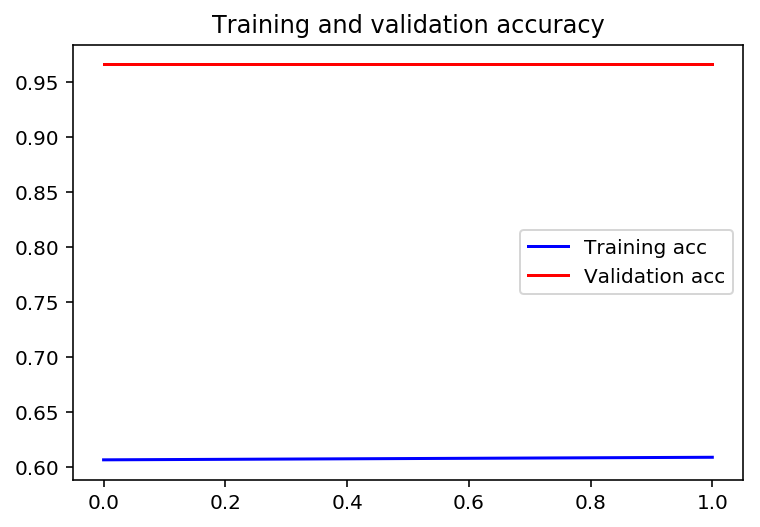

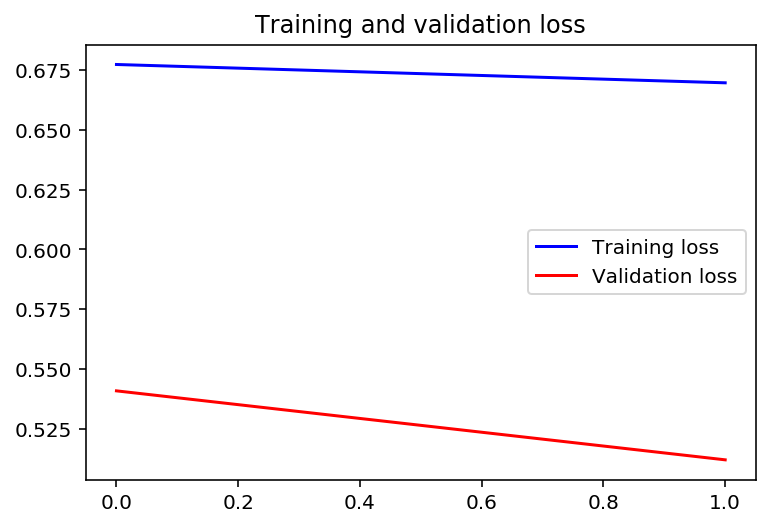

In [33]:
# Save model
model.save('model.h5')

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

# Performance of Model using Test Images

## Sample Test Data from Test Dataset

CPU times: user 739 ms, sys: 607 ms, total: 1.35 s
Wall time: 9.23 s
CPU times: user 741 ms, sys: 566 ms, total: 1.31 s
Wall time: 9.07 s


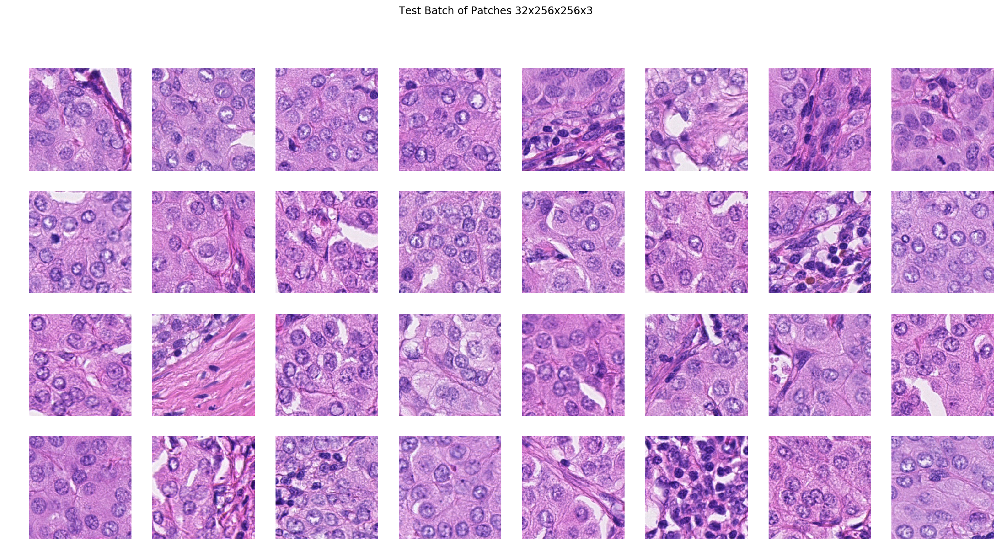

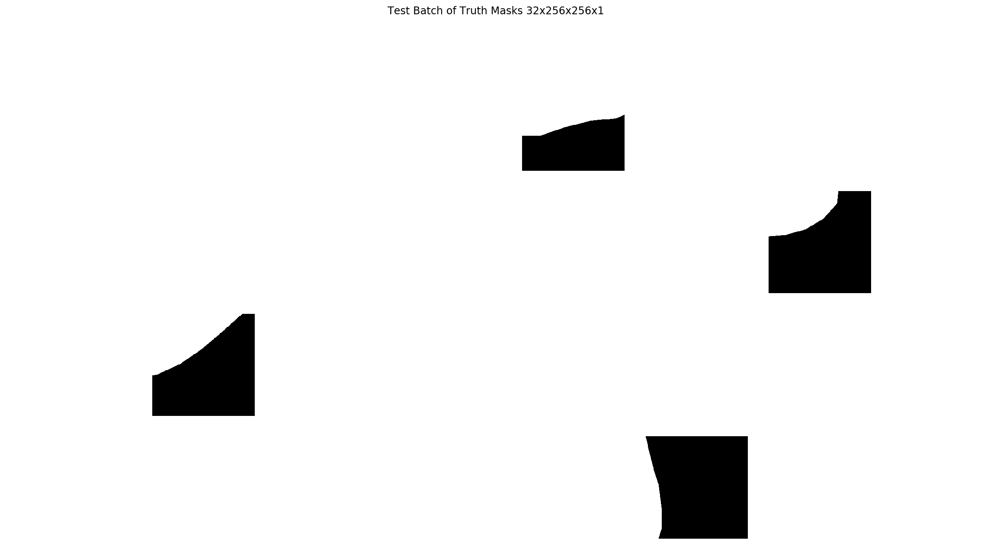

In [81]:
test_sample = gen_imgs(test_samples.sample(32, random_state=25), 32, shuffle=False)
%time example_X, example_y  = next(test_sample)


test_sample1 = gen_imgs(test_samples.sample(32, random_state=27), 32, shuffle=False)
%time example_X1, example_y1  = next(test_sample1)


f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_X[i]);
    _ = ax[i].axis('off');
f.suptitle('Test Batch of Patches 32x256x256x3');
    
f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()    
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_y[i].argmax(axis=2),  cmap='gray', vmin=0, vmax=1);
    _ = ax[i].axis('off');
f.suptitle('Test Batch of Truth Masks 32x256x256x1');

In [0]:
def predict_from_model(patch, model):
    """Predict which pixels are tumor.
    
    input: patch: 256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    
    prediction = model.predict(patch.reshape(1, 256, 256, 3))
    prediction = prediction[:, :, :, 1].reshape(256, 256)
    return prediction

In [0]:
import matplotlib.gridspec as gridspec

def plot_blend(patch, prediction, ax, alpha=0.75):
    """alpha blend patch and prediction.
    https://matplotlib.org/examples/pylab_examples/layer_images.html
    
    input: patch: 256x256x3, rgb image
    input: prediction: 256x256x1, per-pixel tumor probability
    input: ax: maplotlib Axes object
    input: alpha: alpha blend
    """
    
    dx, dy = 0.05, 0.05
    x = np.arange(0, patch.shape[1] - 1, dx)
    y = np.arange(0, patch.shape[0] - 1, dy)
    xmin, xmax, ymin, ymax = np.amin(x), np.amax(x), np.amin(y), np.amax(y)
    extent = xmin, xmax, ymin, ymax

    # fig = plt.figure(frameon=False, figsize=(10, 5))
    Z1 = cv2.cvtColor(patch, code=cv2.COLOR_RGB2GRAY)
    Z2 = prediction

    im1 = ax.imshow(Z1, cmap='gray', extent=extent)
    im2 = ax.imshow(Z2, cmap='jet', alpha=alpha, vmin=0.0, vmax=1.0,
                     extent=extent)
    ax.axis('off');
def plot_patch_with_pred(patch, truth, prediction, title_str='', alpha=0.6):
    """
    input: patch: 256x256x3, rgb image
    input: truth: 256x256x2, onehot output classes (not_tumor, tumor)
    input: prediction: 256x256x1, per-pixel tumor probability
    """
    gs = gridspec.GridSpec(2, 4, width_ratios=[10, 10, 19, 1])
    ax0 = plt.subplot(gs[0, 0])
    ax1 = plt.subplot(gs[0, 1])
    ax2 = plt.subplot(gs[1, 0])
    ax3 = plt.subplot(gs[1, 1])
    ax4 = plt.subplot(gs[:, 2])
    axc = plt.subplot(gs[:, 3])

    ax0.imshow(patch);
    ax0.set_title('Original')
    
    ax1.imshow(truth.argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    ax1.set_title('Truth mask (white=tumor, black=not_tumor)')
    
    p = ax2.imshow(prediction, cmap='jet', vmin=0, vmax=1);
    ax2.set_title('Prediction heatmap')

    ax3.imshow((prediction > 0.5).astype(np.int), cmap='gray', vmin=0, vmax=1);
    ax3.set_title('Prediction mask (white=tumor, black=not_tumor)')
    
    plot_blend(patch, prediction, ax4, alpha)
    ax4.set_title('Original+Prediction blend')
    
    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    fig.suptitle(title_str)
    fig.colorbar(p, cax=axc, orientation="vertical")
    axc.set_title('Probability pixel is tumor')
















# Result 1

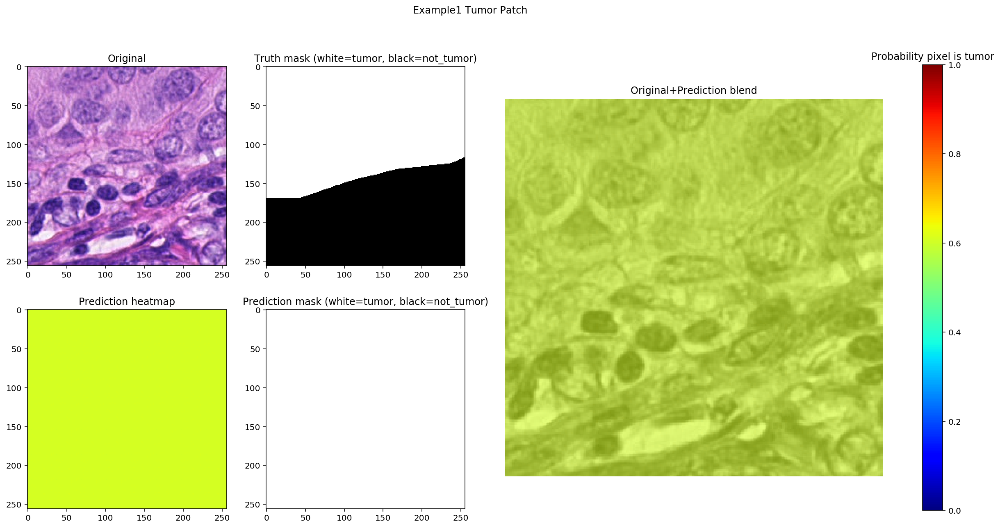

In [82]:
example_patch = example_X[4]
example_truth = example_y[4]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example1 Tumor Patch')

count    65536.000000
mean         0.608263
std          0.000838
min          0.605200
25%          0.607596
50%          0.608253
75%          0.608809
max          0.610663
dtype: float64


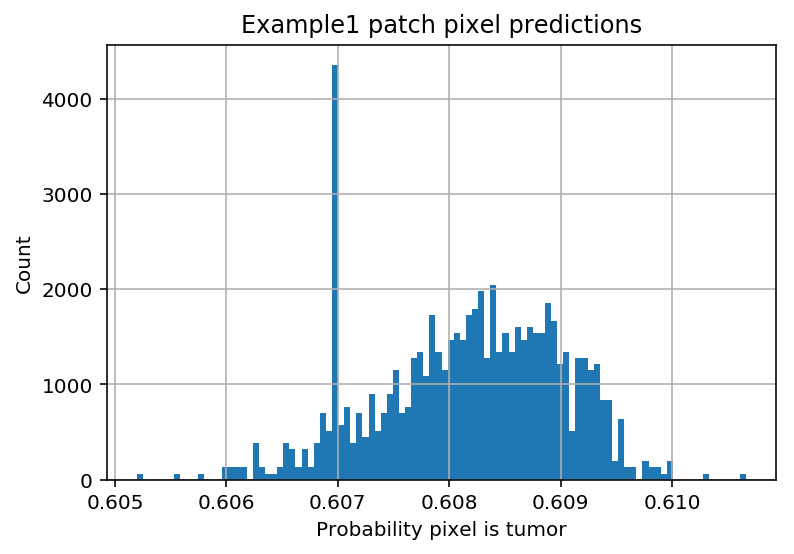

In [83]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example1 patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

# Result 2

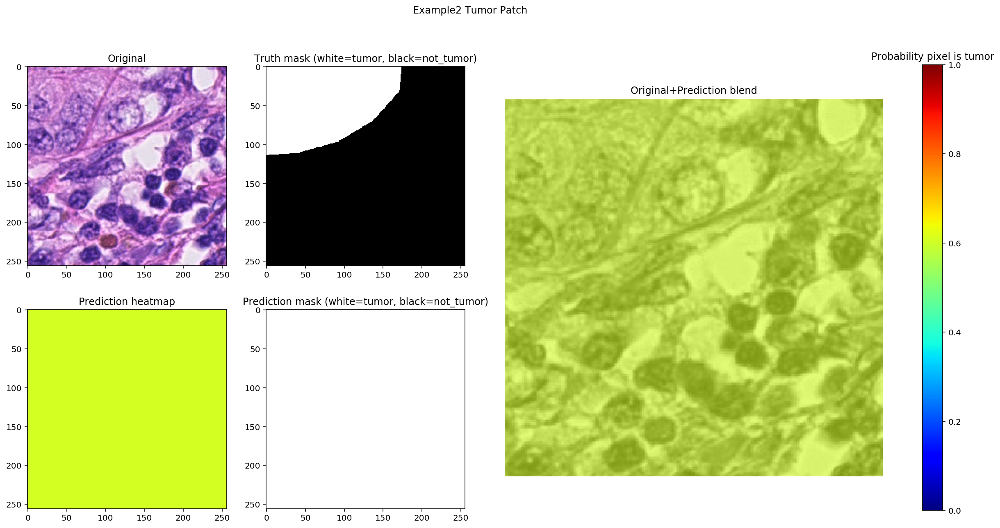

In [84]:
example_patch = example_X[14]
example_truth = example_y[14]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example2 Tumor Patch')

count    65536.000000
mean         0.608263
std          0.000838
min          0.605200
25%          0.607596
50%          0.608253
75%          0.608809
max          0.610663
dtype: float64


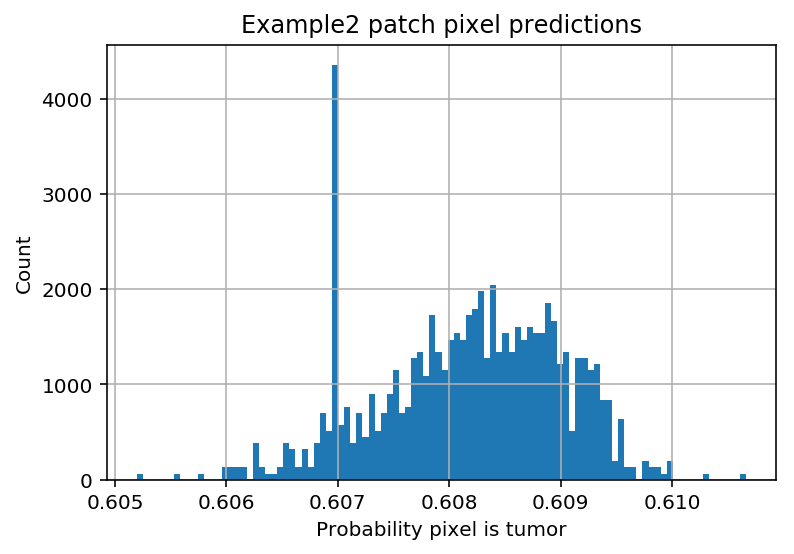

In [85]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example2 patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

# Result 3

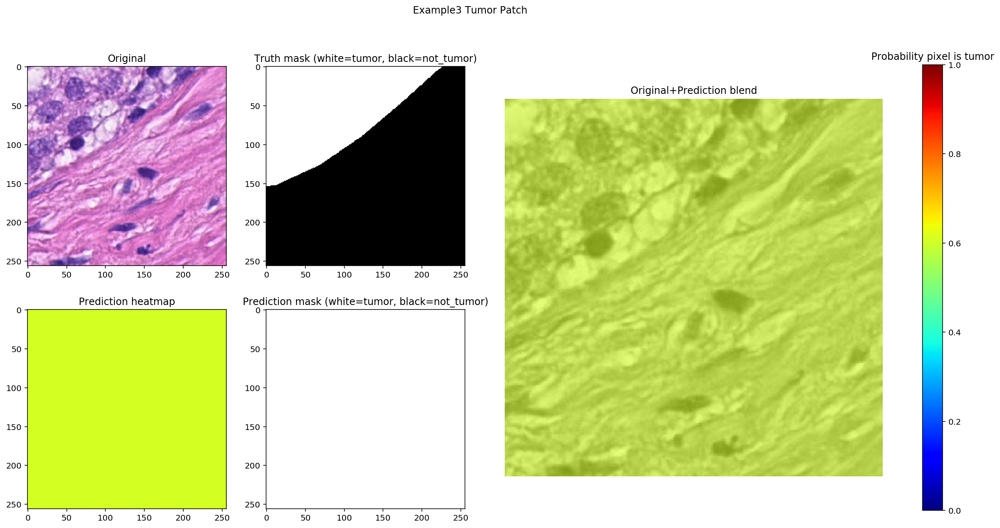

In [86]:
example_patch = example_X[17]
example_truth = example_y[17]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example3 Tumor Patch')

count    65536.000000
mean         0.608263
std          0.000838
min          0.605200
25%          0.607596
50%          0.608253
75%          0.608809
max          0.610663
dtype: float64


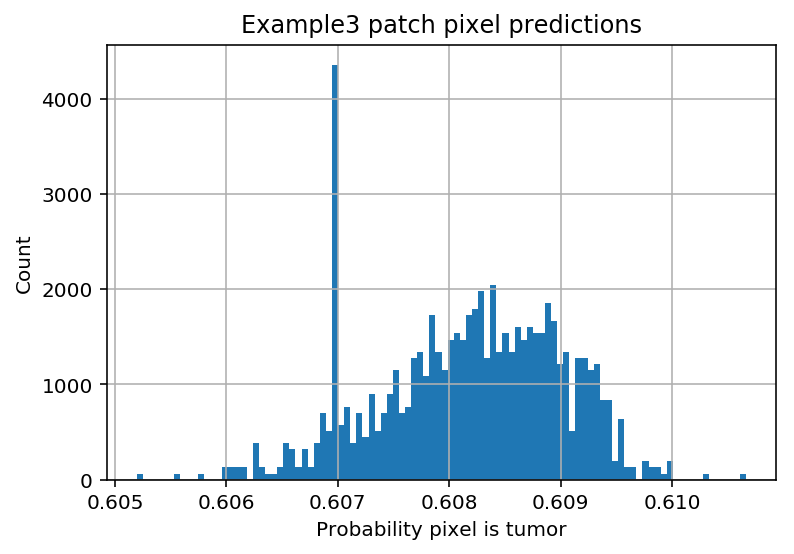

In [87]:

pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example3 patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

# Result 4

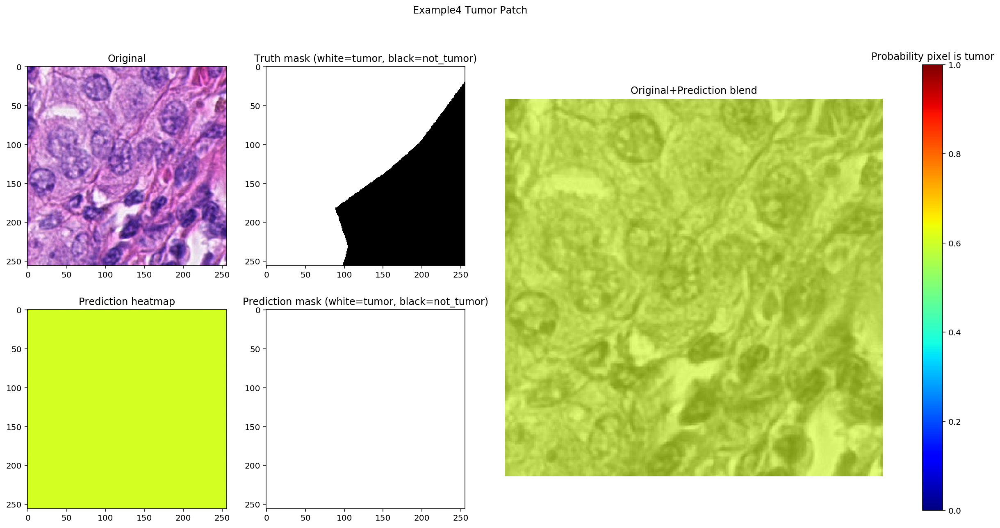

In [88]:
example_patch = example_X1[8]
example_truth = example_y1[8]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example4 Tumor Patch')

count    65536.000000
mean         0.608263
std          0.000838
min          0.605200
25%          0.607596
50%          0.608253
75%          0.608809
max          0.610663
dtype: float64


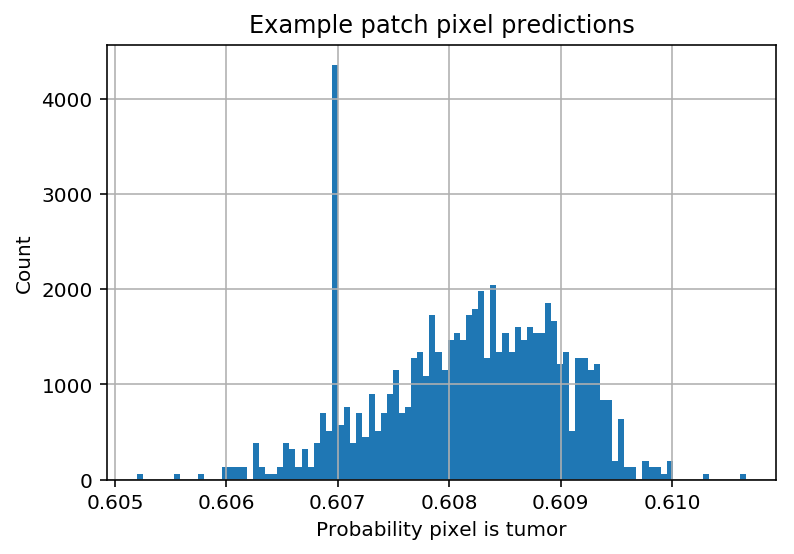

In [89]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

# Result 5

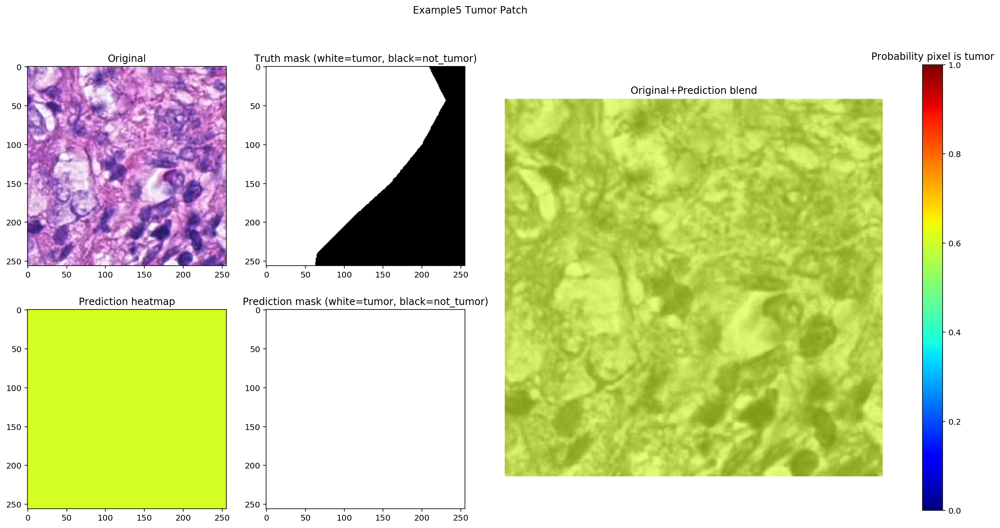

In [90]:
example_patch = example_X1[26]
example_truth = example_y1[26]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example5 Tumor Patch')

count    65536.000000
mean         0.608263
std          0.000838
min          0.605200
25%          0.607596
50%          0.608253
75%          0.608809
max          0.610663
dtype: float64


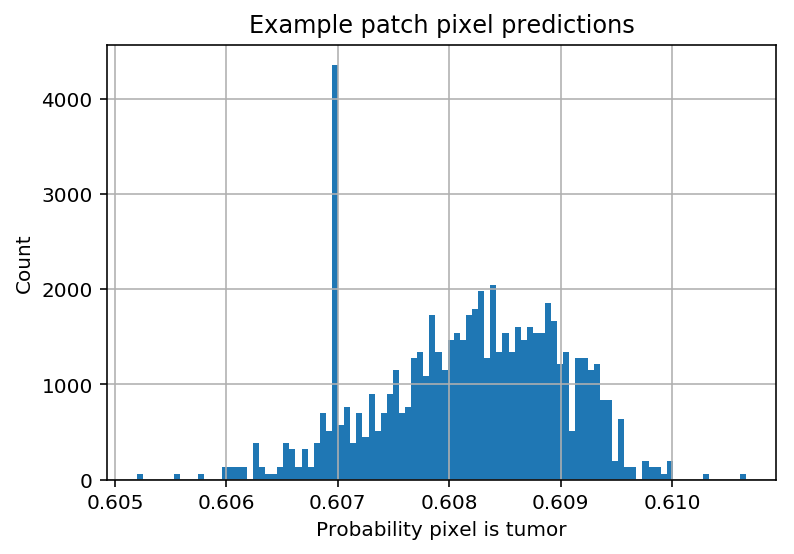

In [91]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

# Result 6

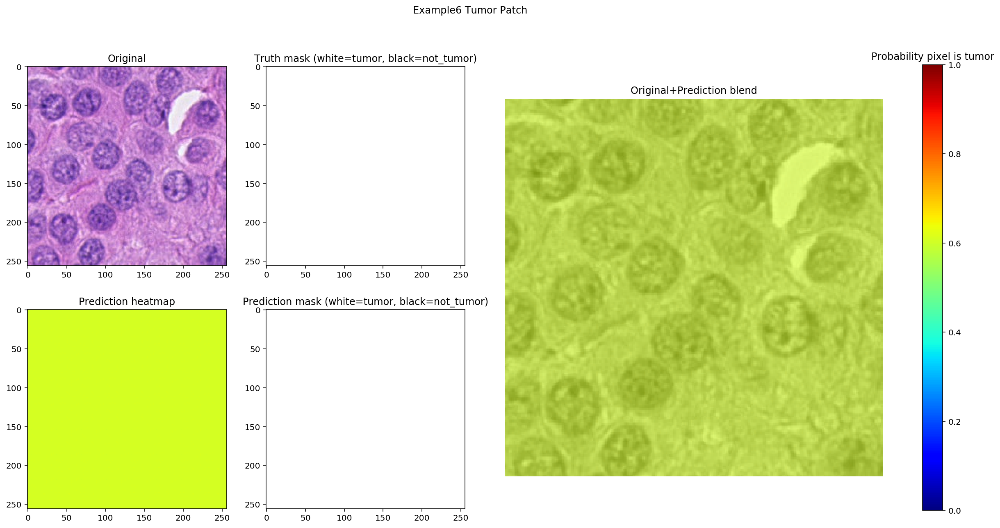

In [92]:
example_patch = example_X1[29]
example_truth = example_y1[29]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example6 Tumor Patch')

count    65536.000000
mean         0.608263
std          0.000838
min          0.605200
25%          0.607596
50%          0.608253
75%          0.608809
max          0.610663
dtype: float64


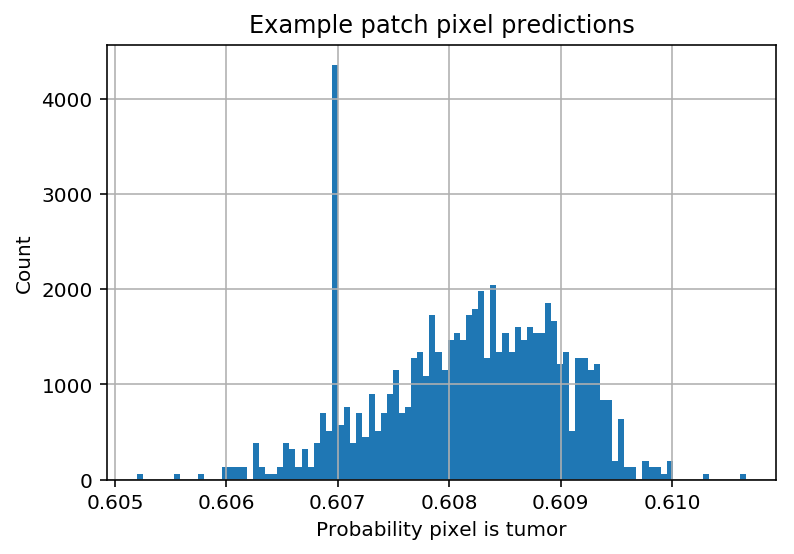

In [93]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

In [48]:
from sklearn.metrics import confusion_matrix
from tqdm import tqdm

def predict_batch_from_model(patches, model):
    """Predict which pixels are tumor.
    
    input: patch: `batch_size`x256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    predictions = model.predict(patches)
    predictions = predictions[:, :, :, 1]
    return predictions

test_generator = gen_imgs(test_samples, BATCH_SIZE)
test_steps = np.ceil(len(test_samples) / BATCH_SIZE)

confusion_mtx = np.zeros((2, 2))

for i in tqdm(range(int(test_steps))):
    X, y  = next(test_generator)
    preds = predict_batch_from_model(X, model)
    
    y_true = y[:, :, :, 1].ravel()
    y_pred = np.uint8(preds > 0.5).ravel()
    
    confusion_mtx += confusion_matrix(y_true, y_pred, labels=[0, 1])

100%|██████████| 25/25 [05:53<00:00, 14.42s/it]


# Confusion Matrix over Entire Test Dataset

In [49]:
confusion_mtx


array([[       0.,  1842301.],
       [       0., 50586499.]])

In [0]:
tn = confusion_mtx[0, 0]
fp = confusion_mtx[0, 1]
fn = confusion_mtx[1, 0]
tp = confusion_mtx[1, 1]

In [51]:
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
precision = tp / (tp + fp)
f1_score = 2 * ((precision * recall) / (precision + recall))

print("Accuracy: %.2f" % accuracy)
print("Recall: %.2f" % recall)
print("Precision: %.2f" % precision)
print("F1 Score: %.2f" % f1_score)

Accuracy: 0.96
Recall: 1.00
Precision: 0.96
F1 Score: 0.98
